In [1]:
import pandas as pd

In [2]:
movies_df=pd.read_csv('dataset\ml-latest\movies.csv', usecols=['movieId','title'], dtype={'movieId':'int32','title':'str'})
movies_df.head()

,movieId,title
0,1,Toy Story (1995)
1,2,Jumanji (1995)
2,3,Grumpier Old Men (1995)
3,4,Waiting to Exhale (1995)
4,5,Father of the Bride Part II (1995)


In [3]:
ratings_df=pd.read_csv('dataset/ml-latest/ratings.csv',
    usecols=['userId', 'movieId', 'rating'],dtype={'userId': 'int32', 'movieId': 'int32', 'rating': 'float32'})
ratings_df.head()

,userId,movieId,rating
0,1,1,4.0
1,1,110,4.0
2,1,158,4.0
3,1,260,4.5
4,1,356,5.0


In [4]:
#checkinng for NaN values
movies_df.isnull().sum()

movieId    0
title      0
dtype: int64

In [5]:
ratings_df.isnull().sum()

userId       0
movieId      0
rating       0
timestamp    0
dtype: int64

In [6]:
print("Movies:",movies_df.shape)
print("Ratings:",ratings_df.shape)

Movies: (86537, 2)
Ratings: (33832162, 4)


In [11]:
#movies_df.info()
#ratings_df.info()
movies_merged_df=movies_df.merge(ratings_df, on='movieId')
movies_merged_df.head()

,movieId,title,userId,rating
0,1,Toy Story (1995),1,4.0
1,1,Toy Story (1995),2,5.0
2,1,Toy Story (1995),7,4.0
3,1,Toy Story (1995),10,3.0
4,1,Toy Story (1995),12,5.0


In [8]:
movies_average_rating=movies_merged_df.groupby('title')['rating'].mean().sort_values(ascending=False).reset_index().rename(columns={'rating':'Average Rating'})
movies_average_rating.head()

,title,Average Rating
0,Atelier Fontana (2011),5.0
1,The Clue to Love (2021),5.0
2,Fury: The Tales of Ronan Pierce (2014),5.0
3,The Cathedral (2022),5.0
4,GORED (2015),5.0


In [9]:
movies_rating_count=movies_merged_df.groupby('title')['rating'].count().sort_values(ascending=True).reset_index().rename(columns={'rating':'Rating Count'}) #ascending=False
movies_rating_count_avg=movies_rating_count.merge(movies_average_rating, on='title')
movies_rating_count_avg.head()

,title,Rating Count,Average Rating
0,Counter-Attack (1945),1,3.0
1,My Sister's Keeper (2002),1,3.0
2,Decoration Day (1990),1,3.0
3,Decor (2014),1,5.0
4,Deconstruction Workers (2008),1,4.0


In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale = 1)
plt.rcParams["axes.grid"] = False
plt.style.use('dark_background')
%matplotlib inline

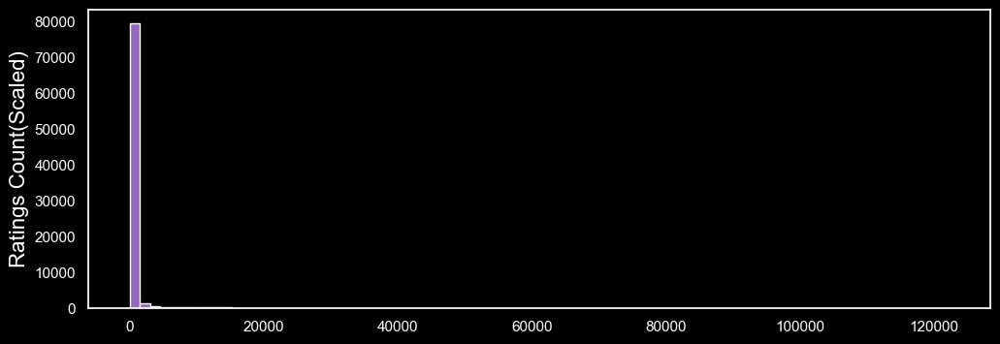

In [22]:
plt.figure(figsize=(12,4))
plt.hist(movies_rating_count_avg['Rating Count'],bins=80,color='tab:purple')
plt.ylabel('Ratings Count(Scaled)', fontsize=16)
plt.savefig('ratingcounthist.jpg')

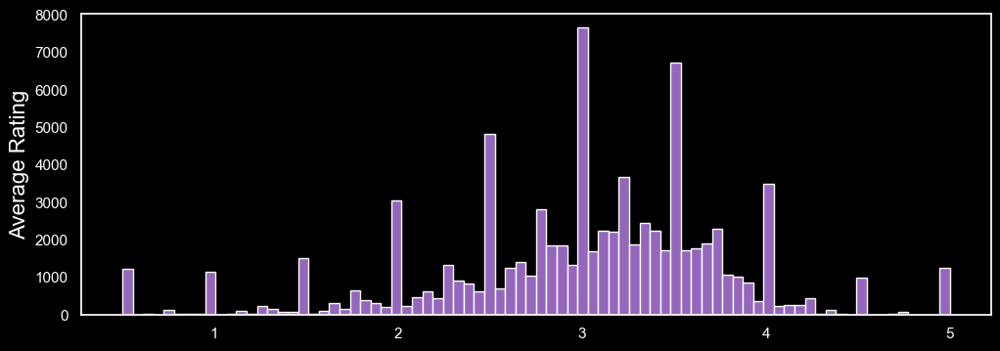

In [23]:
plt.figure(figsize=(12,4))
plt.hist(movies_rating_count_avg['Average Rating'],bins=80,color='tab:purple')
plt.ylabel('Average Rating',fontsize=16)
plt.savefig('avgratinghist.jpg')

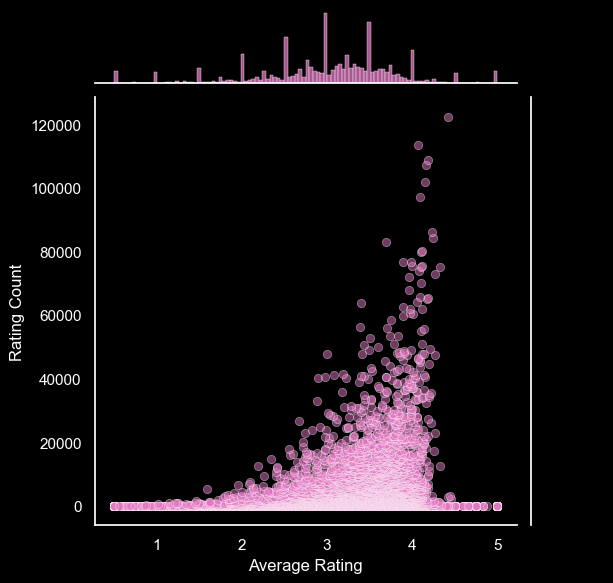

In [24]:
plot=sns.jointplot(x='Average Rating',y='Rating Count',data=movies_rating_count_avg,alpha=0.5, color='tab:pink')
plot.savefig('joinplot.jpg')

In [1]:
from surprise import Dataset, Reader
import random
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [5]:
#DATABASE 3M
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)

In [2]:
# DATABASE 100K
data = Dataset.load_builtin("ml-100k")

In [2]:
# DATABASE 1M contenente i rating
data = Dataset.load_builtin("ml-1m")

In [54]:
#leggo i dataset contenenti i film con relativi id,nomi e generi
movies_df = pd.read_csv('dataset/ml-1m/movies.dat',
                        delimiter='::', engine= 'python', header=None,
                        names=['movie_id','movie_name', 'genre'], encoding='latin-1')
movies_df.head()

#creo un dizionario che collega gli id dei film ai relativi titoli

idToName = movies_df.set_index('movie_id').transpose().to_dict(orient='dict')

In [3]:
raw_ratings = data.raw_ratings

# shuffle ratings if you want
random.shuffle(raw_ratings)

# A = 80% of the data, B = 20% of the data
threshold = int(0.8 * len(raw_ratings))
A_raw_ratings = raw_ratings[:threshold]
B_raw_ratings = raw_ratings[threshold:]

data.raw_ratings = A_raw_ratings  # data is now the set A

# retrain on the whole set A
trainset = data.build_full_trainset()

# Compute unbiased accuracy on B
testset = data.construct_testset(B_raw_ratings)  # testset is now the set B

In [4]:
from surprise import accuracy, Dataset, SVD, KNNBasic, KNNWithMeans, KNNWithZScore
from surprise.model_selection import GridSearchCV
from surprise import Prediction
from collections import defaultdict

In [23]:
#TUNING SVD
# Select your best algo with grid search.
print("Grid Search...")
# hyperparameters search space
# We do not set 'lr_all' and 'reg_all' because they will be overriden by the other lr_ and reg_ parameters

param_grid  = {
    'n_factors': [10, 50, 100, 150, 200],
    'init_mean': [-0.5, 0.5],
    'init_std_dev': [0.01, 0.2],
    'lr_bu': [1e-6, 0.1], 
    'lr_bi': [1e-6, 0.1], 
    'lr_pu': [1e-6, 0.1], 
    'lr_qi': [1e-6, 0.1], 
    'reg_bu': [1e-6, 1],
    'reg_bi': [1e-6, 1], 
    'reg_pu': [1e-6, 1], 
    'reg_qi': [1e-6, 1]
}
grid_search = GridSearchCV(SVD, param_grid, measures=["rmse"], cv=3)
grid_search.fit(data)

algo = grid_search.best_estimator["rmse"]

# retrain on the whole set A
trainset = data.build_full_trainset()
algo.fit(trainset)

# Compute biased accuracy on A
predictions = algo.test(trainset.build_testset())
print("Biased accuracy on A,", end="   ")
accuracy.rmse(predictions)

# Compute unbiased accuracy on B
testset = data.construct_testset(B_raw_ratings)  # testset is now the set B
predictions = algo.test(testset)
print("Unbiased accuracy on B,", end=" ")
accuracy.rmse(predictions)

Grid Search...
Biased accuracy on A,   RMSE: 0.9505
Unbiased accuracy on B, RMSE: 0.9789


0.9789100669510182

In [24]:
grid_search.best_params

{'rmse': {'n_factors': 50,
  'init_mean': -0.5,
  'init_std_dev': 0.2,
  'lr_bu': 0.1,
  'lr_bi': 0.1,
  'lr_pu': 0.1,
  'lr_qi': 0.1,
  'reg_bu': 1e-06,
  'reg_bi': 1e-06,
  'reg_pu': 1,
  'reg_qi': 1}}

In [25]:
x=pd.DataFrame.from_dict(grid_search.cv_results)
x.to_csv('grid_searchSVD.csv')

In [26]:
x

,split0_test_rmse,split1_test_rmse,split2_test_rmse,mean_test_rmse,std_test_rmse,rank_test_rmse,mean_fit_time,std_fit_time,mean_test_time,std_test_time,...,param_init_mean,param_init_std_dev,param_lr_bu,param_lr_bi,param_lr_pu,param_lr_qi,param_reg_bu,param_reg_bi,param_reg_pu,param_reg_qi
0,1.846042,1.834934,1.857018,1.845998,0.009016,2537,0.284990,0.006681,0.141993,0.042452,...,-0.5,0.01,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001
1,1.846042,1.834934,1.857018,1.845998,0.009016,2539,0.244664,0.005746,0.137975,0.046686,...,-0.5,0.01,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,1.000000
2,1.846042,1.834933,1.857018,1.845998,0.009016,2535,0.246682,0.009438,0.135660,0.044076,...,-0.5,0.01,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,1.000000,0.000001
3,1.846042,1.834934,1.857018,1.845998,0.009016,2534,0.235406,0.003607,0.165649,0.043614,...,-0.5,0.01,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,1.000000,1.000000
4,1.846041,1.834934,1.857018,1.845998,0.009016,2529,0.237638,0.003784,0.139653,0.039166,...,-0.5,0.01,0.000001,0.000001,0.000001,0.000001,0.000001,1.000000,0.000001,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5115,1.851166,1.839052,1.861720,1.850646,0.009261,3012,0.785501,0.003899,0.155345,0.050045,...,0.5,0.20,0.100000,0.100000,0.100000,0.100000,1.000000,0.000001,1.000000,1.000000
5116,1.851166,1.839052,1.861720,1.850646,0.009261,3032,0.808993,0.015746,0.157679,0.054118,...,0.5,0.20,0.100000,0.100000,0.100000,0.100000,1.000000,1.000000,0.000001,0.000001
5117,1.851166,1.839052,1.861720,1.850646,0.009261,3033,0.779362,0.002060,0.152333,0.048535,...,0.5,0.20,0.100000,0.100000,0.100000,0.100000,1.000000,1.000000,0.000001,1.000000
5118,1.851166,1.839052,1.861720,1.850646,0.009261,3789,0.787675,0.008707,0.186168,0.048327,...,0.5,0.20,0.100000,0.100000,0.100000,0.100000,1.000000,1.000000,1.000000,0.000001


In [50]:
#TUNING KNNBasic Item-based
# Select your best algo with grid search.
print("Grid Search...")
param_grid = {"k": range(30,50), "sim_options": {"name":["cosine","msd","pearson"], "user_based": [False],}, "verbose": [False]}
grid_search = GridSearchCV(KNNBasic, param_grid, measures=["rmse"], cv=3)
grid_search.fit(data)
algo = grid_search.best_estimator["rmse"]

# retrain on the whole set A
trainset = data.build_full_trainset()
algo.fit(trainset)

# Compute biased accuracy on A
predictions = algo.test(trainset.build_testset())
print("Biased accuracy on A,", end="   ")
accuracy.rmse(predictions)

# Compute unbiased accuracy on B
testset = data.construct_testset(B_raw_ratings)  # testset is now the set B
predictions = algo.test(testset)
print("Unbiased accuracy on B,", end=" ")
accuracy.rmse(predictions)

Grid Search...
Biased accuracy on A,   RMSE: 0.7132
Unbiased accuracy on B, RMSE: 0.9750


0.974987679983839

In [51]:
risultatigs= pd.DataFrame.from_dict(grid_search.cv_results)
print(risultatigs)
print("best params: ")
print(grid_search.best_params)

    split0_test_rmse  split1_test_rmse  split2_test_rmse  mean_test_rmse  \
0           1.048051          1.045205          1.049670        1.047642   
1           0.994256          0.991764          0.993917        0.993312   
2           1.059623          1.053930          1.058439        1.057331   
3           1.046818          1.044463          1.048493        1.046591   
4           0.993965          0.991362          0.993804        0.993044   
5           1.058669          1.053206          1.057445        1.056440   
6           1.046110          1.043391          1.047498        1.045666   
7           0.993663          0.990914          0.993563        0.992713   
8           1.057820          1.052477          1.056619        1.055638   
9           1.045274          1.042578          1.046456        1.044769   
10          0.993620          0.990725          0.993251        0.992532   
11          1.057219          1.051768          1.055760        1.054916   
12          

In [52]:
#TUNING KNNBasic User-based
# Select your best algo with grid search.
print("Grid Search...")
param_grid = {"k": range(30,50), "sim_options": {"name":["cosine","msd","pearson"], "user_based": [True],}, "verbose": [False]}
grid_search = GridSearchCV(KNNBasic, param_grid, measures=["rmse"], cv=3)
grid_search.fit(data)
algo = grid_search.best_estimator["rmse"]

# retrain on the whole set A
trainset = data.build_full_trainset()
algo.fit(trainset)

# Compute biased accuracy on A
predictions = algo.test(trainset.build_testset())
print("Biased accuracy on A,", end="   ")
accuracy.rmse(predictions)

# Compute unbiased accuracy on B
testset = data.construct_testset(B_raw_ratings)  # testset is now the set B
predictions = algo.test(testset)
print("Unbiased accuracy on B,", end=" ")
accuracy.rmse(predictions)

Grid Search...
Biased accuracy on A,   RMSE: 0.7390
Unbiased accuracy on B, RMSE: 0.9758


0.975825361614348

In [53]:
risultatigs= pd.DataFrame.from_dict(grid_search.cv_results)
print(risultatigs)
print("best params: ")
print(grid_search.best_params)

    split0_test_rmse  split1_test_rmse  split2_test_rmse  mean_test_rmse  \
0           1.028223          1.020503          1.025506        1.024744   
1           0.993826          0.987650          0.992212        0.991229   
2           1.028768          1.021324          1.027624        1.025905   
3           1.027877          1.020237          1.025347        1.024487   
4           0.993930          0.987615          0.992307        0.991284   
5           1.028554          1.021096          1.027383        1.025678   
6           1.027720          1.020173          1.024796        1.024230   
7           0.993983          0.987809          0.992271        0.991354   
8           1.028361          1.020919          1.027053        1.025444   
9           1.027686          1.020025          1.024467        1.024059   
10          0.994150          0.988048          0.992532        0.991577   
11          1.028143          1.020786          1.026790        1.025240   
12          

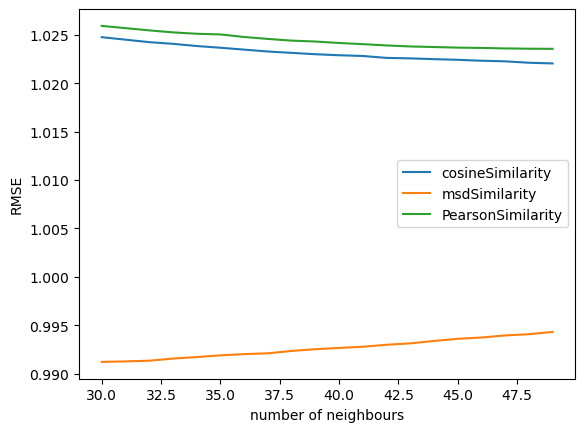

In [58]:
risCosine=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'cosine', 'user_based': True}]
risMsd=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'msd', 'user_based': True}]
risPearson=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'pearson', 'user_based': True}]
plt.plot(range(30,50),risCosine["mean_test_rmse"], label = "cosineSimilarity")
plt.plot(range(30,50),risMsd["mean_test_rmse"], label = "msdSimilarity")
plt.plot(range(30,50),risPearson["mean_test_rmse"], label = "PearsonSimilarity")
plt.xlabel("number of neighbours")
plt.ylabel("RMSE")
plt.legend()
plt.show()

In [59]:
#TUNING KNNWithMeans Item-based
# Select your best algo with grid search.
print("Grid Search...")
param_grid = {"k": range(30,50), "sim_options": {"name":["cosine","msd","pearson"], "user_based": [False],}, "verbose": [False]}
grid_search = GridSearchCV(KNNWithMeans, param_grid, measures=["rmse"], cv=3)
grid_search.fit(data)
algo = grid_search.best_estimator["rmse"]

# retrain on the whole set A
trainset = data.build_full_trainset()
algo.fit(trainset)

# Compute biased accuracy on A
predictions = algo.test(trainset.build_testset())
print("Biased accuracy on A,", end="   ")
accuracy.rmse(predictions)

# Compute unbiased accuracy on B
testset = data.construct_testset(B_raw_ratings)  # testset is now the set B
predictions = algo.test(testset)
print("Unbiased accuracy on B,", end=" ")
accuracy.rmse(predictions)

Grid Search...
Biased accuracy on A,   RMSE: 0.7370
Unbiased accuracy on B, RMSE: 0.9359


0.935911407393743

In [60]:
risultatigs= pd.DataFrame.from_dict(grid_search.cv_results)
print(risultatigs)
print("best params: ")
print(grid_search.best_params)

    split0_test_rmse  split1_test_rmse  split2_test_rmse  mean_test_rmse  \
0           0.960378          0.955880          0.952911        0.956390   
1           0.950221          0.948120          0.944528        0.947623   
2           0.960409          0.953830          0.953325        0.955855   
3           0.959799          0.955550          0.952300        0.955883   
4           0.949607          0.947762          0.944312        0.947227   
5           0.960191          0.953437          0.952960        0.955529   
6           0.959244          0.955215          0.951917        0.955459   
7           0.949408          0.947382          0.944004        0.946931   
8           0.959952          0.953112          0.952746        0.955270   
9           0.958809          0.954785          0.951449        0.955014   
10          0.949213          0.947139          0.943709        0.946687   
11          0.959745          0.952798          0.952536        0.955026   
12          

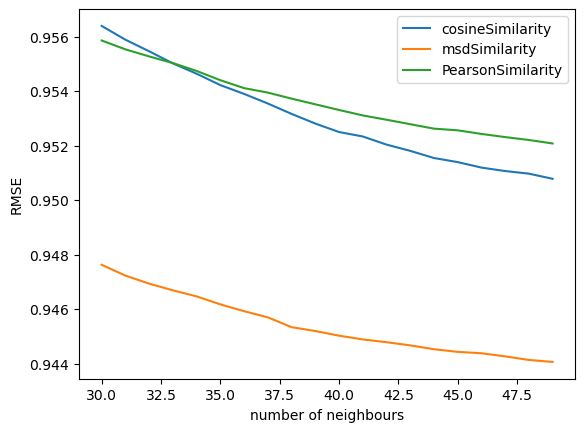

In [63]:
risCosine=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'cosine', 'user_based': False}]
risMsd=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'msd', 'user_based': False}]
risPearson=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'pearson', 'user_based': False}]
plt.plot(range(30,50), risCosine["mean_test_rmse"], label = "cosineSimilarity")
plt.plot(range(30,50), risMsd["mean_test_rmse"], label = "msdSimilarity")
plt.plot(range(30,50), risPearson["mean_test_rmse"], label = "PearsonSimilarity")
plt.xlabel("number of neighbours")
plt.ylabel("RMSE")
plt.legend()
plt.show()

In [64]:
#TUNING KNNWithMeans User-based
# Select your best algo with grid search.
print("Grid Search...")
param_grid = {"k": range(30,50), "sim_options": {"name":["cosine","msd","pearson"], "user_based": [True],}, "verbose": [False]}
grid_search = GridSearchCV(KNNWithMeans, param_grid, measures=["rmse"], cv=3)
grid_search.fit(data)
algo = grid_search.best_estimator["rmse"]

# retrain on the whole set A
trainset = data.build_full_trainset()
algo.fit(trainset)

# Compute biased accuracy on A
predictions = algo.test(trainset.build_testset())
print("Biased accuracy on A,", end="   ")
accuracy.rmse(predictions)

# Compute unbiased accuracy on B
testset = data.construct_testset(B_raw_ratings)  # testset is now the set B
predictions = algo.test(testset)
print("Unbiased accuracy on B,", end=" ")
accuracy.rmse(predictions)

Grid Search...
Biased accuracy on A,   RMSE: 0.7794
Unbiased accuracy on B, RMSE: 0.9572


0.9571665515962663

In [65]:
risultatigs= pd.DataFrame.from_dict(grid_search.cv_results)
print(risultatigs)
print("best params: ")
print(grid_search.best_params)

    split0_test_rmse  split1_test_rmse  split2_test_rmse  mean_test_rmse  \
0           0.961960          0.973635          0.968325        0.967973   
1           0.956414          0.968505          0.962013        0.962311   
2           0.957674          0.971015          0.967160        0.965283   
3           0.961456          0.973229          0.967835        0.967507   
4           0.956189          0.968264          0.961884        0.962112   
5           0.957360          0.970672          0.966777        0.964936   
6           0.960973          0.972756          0.967536        0.967088   
7           0.955809          0.967948          0.961421        0.961726   
8           0.956987          0.970477          0.966708        0.964724   
9           0.960676          0.972420          0.967233        0.966776   
10          0.955425          0.967699          0.961266        0.961464   
11          0.956758          0.970196          0.966426        0.964460   
12          

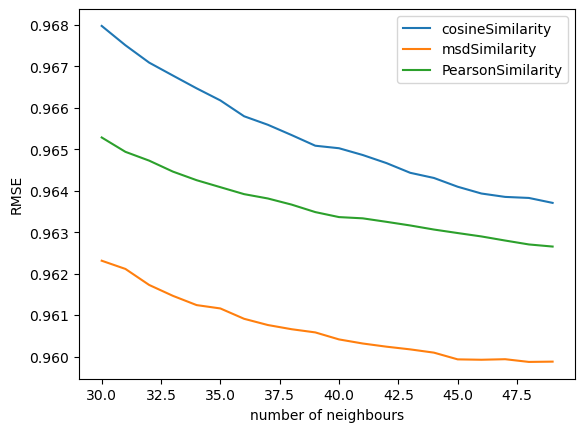

In [67]:
risCosine=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'cosine', 'user_based': True}]
risMsd=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'msd', 'user_based': True}]
risPearson=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'pearson', 'user_based': True}]
plt.plot(range(30,50), risCosine["mean_test_rmse"], label = "cosineSimilarity")
plt.plot(range(30,50), risMsd["mean_test_rmse"], label = "msdSimilarity")
plt.plot(range(30,50), risPearson["mean_test_rmse"], label = "PearsonSimilarity")
plt.xlabel("number of neighbours")
plt.ylabel("RMSE")
plt.legend()
plt.show()

In [68]:
#TUNING KNNWithZScore Item-based
# Select your best algo with grid search.
print("Grid Search...")
param_grid = {"k": range(30,50), "sim_options": {"name":["cosine","msd","pearson"], "user_based": [False],}, "verbose": [False]}
grid_search = GridSearchCV(KNNWithZScore, param_grid, measures=["rmse"], cv=3)
grid_search.fit(data)
algo = grid_search.best_estimator["rmse"]

# retrain on the whole set A
trainset = data.build_full_trainset()
algo.fit(trainset)

# Compute biased accuracy on A
predictions = algo.test(trainset.build_testset())
print("Biased accuracy on A,", end="   ")
accuracy.rmse(predictions)

# Compute unbiased accuracy on B
testset = data.construct_testset(B_raw_ratings)  # testset is now the set B
predictions = algo.test(testset)
print("Unbiased accuracy on B,", end=" ")
accuracy.rmse(predictions)

Grid Search...
Biased accuracy on A,   RMSE: 0.7338
Unbiased accuracy on B, RMSE: 0.9384


0.9384461699270714

In [69]:
risultatigs= pd.DataFrame.from_dict(grid_search.cv_results)
print(risultatigs)
print("best params: ")
print(grid_search.best_params)

    split0_test_rmse  split1_test_rmse  split2_test_rmse  mean_test_rmse  \
0           0.957804          0.958626          0.961449        0.959293   
1           0.947992          0.948190          0.952906        0.949696   
2           0.955701          0.959250          0.960622        0.958525   
3           0.957171          0.957937          0.960995        0.958701   
4           0.947791          0.947648          0.952416        0.949285   
5           0.955179          0.958662          0.960307        0.958049   
6           0.957041          0.957551          0.960460        0.958351   
7           0.947422          0.947577          0.952061        0.949020   
8           0.954917          0.958297          0.959974        0.957729   
9           0.956488          0.956884          0.960187        0.957853   
10          0.947078          0.947234          0.951630        0.948647   
11          0.954600          0.958019          0.959787        0.957469   
12          

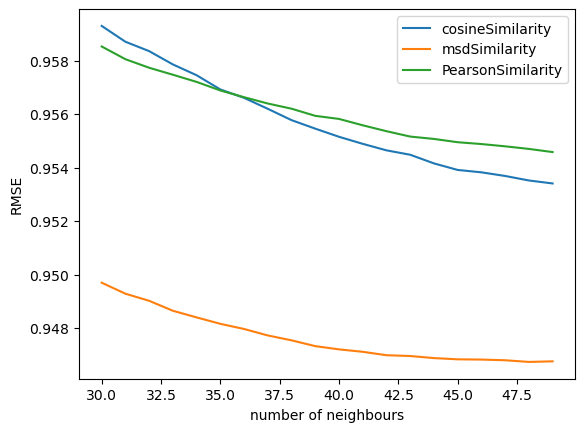

In [70]:
risCosine=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'cosine', 'user_based': False}]
risMsd=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'msd', 'user_based': False}]
risPearson=risultatigs.loc[risultatigs['param_sim_options'] == {'name': 'pearson', 'user_based': False}]
plt.plot(range(30,50), risCosine["mean_test_rmse"], label = "cosineSimilarity")
plt.plot(range(30,50), risMsd["mean_test_rmse"], label = "msdSimilarity")
plt.plot(range(30,50), risPearson["mean_test_rmse"], label = "PearsonSimilarity")
plt.xlabel("number of neighbours")
plt.ylabel("RMSE")
plt.legend()
plt.show()

In [78]:
from collections import defaultdict

from surprise import Dataset, SVD


def get_top_n(predictions, n=10):
    """Return the top-N recommendation for each user from a set of predictions.

    Args:
        predictions(list of Prediction objects): The list of predictions, as
            returned by the test method of an algorithm.
        n(int): The number of recommendation to output for each user. Default
            is 10.

    Returns:
    A dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.
    """

    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n


trainset = data.build_full_trainset()
algo = SVD(n_factors=50,init_mean=-0.5,init_std_dev= 0.2,lr_bu= 0.1,lr_bi= 0.1,lr_pu= 0.1,lr_qi= 0.1,reg_bu= 1e-06,reg_bi= 1e-06,reg_pu= 1, reg_qi= 1)
algo.fit(trainset)

# Than predict ratings for all pairs (u, i) that are NOT in the training set.
testset = data.construct_testset(B_raw_ratings)
predictions = algo.test(testset)

top_n = get_top_n(predictions, n=10)

# Print the recommended items for each user
for uid, user_ratings in top_n.items():
    print(uid, [iid for (iid, _) in user_ratings])

166731 [593, 2959, 1704, 1197, 3578, 4995, 3897, 8784, 73017, 56479]
39681 [457, 364, 377, 303, 376, 362, 253, 370, 367, 46]
37604 [318, 916, 1204, 1254, 1265, 1952, 3062, 1097, 2640, 952]
148754 [4027, 2329, 68358, 260, 59315, 1288, 1089, 63181, 47, 1]
101191 [904, 3147, 1214, 1648, 2058, 3786, 3005, 707, 1395, 3256]
234123 [166445, 47202, 98056, 48516, 6666, 4027, 43376, 589, 7063, 2329]
265524 [4370, 2527]
179886 [1131, 953, 1136, 994, 300, 1224, 1225, 1296, 1356, 454]
27780 [7153, 2959, 7090, 6618, 6539, 46322, 6721, 77846, 3255, 33437]
22269 [858, 106918, 54286, 166568, 4993, 41285, 59315, 207313, 208703, 47610]
284834 [541, 68358, 260, 34405, 5445, 5218, 8169, 58293, 342, 3755]
220820 [364, 231, 21, 434, 442]
296260 [7153, 159817, 48516, 60069, 134853, 59315, 84152, 4306, 106782, 112556]
49973 [509, 497, 161, 368, 262, 7, 24, 3, 514, 349]
117959 [2467, 202439, 593, 88125, 48394, 216855, 1197, 48780, 4034, 912]
225469 [858, 750, 1136, 1284, 1210, 2186, 76251]
137490 [908, 7361, 79

In [22]:
def precision_recall_at_k(predictions, k=10, threshold=3.5):
    """Return precision and recall at k metrics for each user"""

    # First map the predictions to each user.
    user_est_true = defaultdict(list)
    for uid, _, true_r, est, _ in predictions:
        user_est_true[uid].append((est, true_r))

    precisions = dict()
    recalls = dict()
    for uid, user_ratings in user_est_true.items():

        # Sort user ratings by estimated value
        user_ratings.sort(key=lambda x: x[0], reverse=True)

        # Number of relevant items
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)

        # Number of recommended items in top k
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])

        # Number of relevant and recommended items in top k
        n_rel_and_rec_k = sum(
            ((true_r >= threshold) and (est >= threshold))
            for (est, true_r) in user_ratings[:k]
        )

        # Precision@K: Proportion of recommended items that are relevant
        # When n_rec_k is 0, Precision is undefined. We here set it to 0.

        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 0

        # Recall@K: Proportion of relevant items that are recommended
        # When n_rel is 0, Recall is undefined. We here set it to 0.

        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 0

    return precisions, recalls


precisions, recalls = precision_recall_at_k(predictions, k=10, threshold=4)


In [82]:
print(sum(prec for prec in precisions.values()) / len(precisions))
print(sum(rec for rec in recalls.values()) / len(recalls))

0.4747483059630044
0.3468478738808381


In [83]:
from surprise import dump

dump.dump(file_name='primaProvaSVD',predictions=predictions,algo=algo)

In [16]:
from collections import defaultdict

#KNNBasic user-based


def get_top_n(predictions, n=10):
    """Return the top-N recommendation for each user from a set of predictions.

    Args:
        predictions(list of Prediction objects): The list of predictions, as
            returned by the test method of an algorithm.
        n(int): The number of recommendation to output for each user. Default
            is 10.

    Returns:
    A dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.
    """

    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n


trainset = data.build_full_trainset()
algo = KNNBasic(k=30,sim_options= {'name': 'msd', 'user_based': True}, verbose= False)
algo.fit(trainset)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
testset = data.construct_testset(B_raw_ratings)
predictions = algo.test(testset)

top_n = get_top_n(predictions, n=10)
"""""
# Print the recommended items for each user
for uid, user_ratings in top_n.items():
    print("utente: ", uid)
    mostraListaConsigliati(uid,top_n,idToName)
"""


3313 ['527', '2858', '919', '1148', '2186', '1196', '1214', '1207', '720', '1610']
1053 ['2571', '1248', '924', '950', '2194', '541', '2692', '1197', '1610', '3062']
2395 ['356', '2858', '1198', '3147', '1201', '1', '1287', '1674', '2917', '246']
5539 ['50', '3435', '3022', '1219', '2762', '1945', '969', '1250', '1237', '593']
3747 ['2858', '912', '150', '3114', '2396', '2917', '1276', '3783', '2692', '509']
4449 ['1148', '920', '1235', '1228', '1307', '2716', '32', '2795', '2686', '539']
5995 ['318', '2571', '898', '32', '1356', '1222', '3751', '3068', '2355', '1101']
4041 ['2571', '919', '260', '2804', '1198', '1387', '924', '1259', '2797', '1201']
2148 ['1278', '919', '1198', '1240', '1136', '364', '1222', '2797', '587', '2080']
4005 ['858', '296', '1231', '457', '1387', '11', '2858', '1408', '1036', '2000']
3476 ['318', '1212', '1197', '919', '1204', '2028', '1267', '899', '539', '1304']
3953 ['1148', '2019', '1246', '1250', '260', '2959', '1197', '1208', '3007', '1079']
5652 ['428

In [134]:
#stampa la lista dei film consigliati
def mostraListaConsigliati(idUtente,top,idToName):
    """prints the list top-N recommendation for a user from a set of predictions.

    Args:
        idUtente(string): the id of the user.
        n(dict): dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.

    Returns:
        Nothing
    """
    i=1
    for x in top[idUtente]:
         print(i,' Titolo:', idToName.get(int(x[0]))["movie_name"], 'ratingStimato', x[1])
        i=i+1

In [136]:
#test stampate le liste di film consigliati
for uid, user_ratings in top_n.items():
    if random.random()<0.01:
        print("utente: "+ uid)
        mostraListaConsigliati(uid,top_n,idToName)

utente: 1120
1  Titolo: Godfather: Part II, The (1974) ratingStimato 4.803369026301702
2  Titolo: Close Shave, A (1995) ratingStimato 4.773065153755707
3  Titolo: Apocalypse Now (1979) ratingStimato 4.663738758364135
4  Titolo: American Beauty (1999) ratingStimato 4.6479091478714025
5  Titolo: Toy Story (1995) ratingStimato 4.6432435749664
6  Titolo: Graduate, The (1967) ratingStimato 4.607062932263775
7  Titolo: Insider, The (1999) ratingStimato 4.573927778707506
8  Titolo: Who's Afraid of Virginia Woolf? (1966) ratingStimato 4.573620709098646
9  Titolo: Raiders of the Lost Ark (1981) ratingStimato 4.562101761003198
10  Titolo: Chinatown (1974) ratingStimato 4.556216711906798
utente: 4902
1  Titolo: Wrong Trousers, The (1993) ratingStimato 4.717591670211598
2  Titolo: Forrest Gump (1994) ratingStimato 4.2898628072709
3  Titolo: West Side Story (1961) ratingStimato 4.2601998955952185
4  Titolo: Ben-Hur (1959) ratingStimato 4.243633519486265
5  Titolo: Good, The Bad and The Ugly, The (1

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class

In [18]:
precisions, recalls = precision_recall_at_k(predictions, k=10, threshold=4)
print(sum(prec for prec in precisions.values()) / len(precisions))
print(sum(rec for rec in recalls.values()) / len(recalls))

0.7765401136716213
0.38766435290852175


In [135]:
mostraListaConsigliati("4065",top_n,idToName)

1  Titolo: Casablanca (1942) ratingStimato 4.533333333333333
2  Titolo: Blade Runner (1982) ratingStimato 4.4
3  Titolo: X-Men (2000) ratingStimato 4.033333333333333
4  Titolo: Galaxy Quest (1999) ratingStimato 3.7333333333333334
5  Titolo: Westworld (1973) ratingStimato 3.593023645407223
6  Titolo: Grease 2 (1982) ratingStimato 2.2308262921411814


,user_id,movie_id,rating,time
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [104]:
idToName = movies_df.set_index('movie_id').transpose().to_dict(orient='dict')

In [111]:
idToName.get(1).get("movie_name")

'Toy Story (1995)'

In [129]:
i=1
for x in top_n["4065"]:
    print(i,' Titolo:', idToName.get(int(x[0])).get("movie_name"), 'ratingStimato', x[1])
    i=i+1

1  Titolo: Casablanca (1942) ratingStimato 4.533333333333333
2  Titolo: Blade Runner (1982) ratingStimato 4.4
3  Titolo: X-Men (2000) ratingStimato 4.033333333333333
4  Titolo: Galaxy Quest (1999) ratingStimato 3.7333333333333334
5  Titolo: Westworld (1973) ratingStimato 3.593023645407223
6  Titolo: Grease 2 (1982) ratingStimato 2.2308262921411814


In [137]:
from collections import defaultdict

#KNNBasic Item-based


def get_top_n(predictions, n=10):
    """Return the top-N recommendation for each user from a set of predictions.

    Args:
        predictions(list of Prediction objects): The list of predictions, as
            returned by the test method of an algorithm.
        n(int): The number of recommendation to output for each user. Default
            is 10.

    Returns:
    A dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.
    """

    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n


trainset = data.build_full_trainset()
algo = KNNBasic(k=41,sim_options= {'name': 'msd', 'user_based': False}, verbose= False)
algo.fit(trainset)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
testset = data.construct_testset(B_raw_ratings)
predictions = algo.test(testset)

top_n = get_top_n(predictions, n=10)
#test stampate le liste di film consigliati
for uid, user_ratings in top_n.items():
    if random.random()<0.001:
        print("utente: "+ uid)
        mostraListaConsigliati(uid,top_n,idToName)

utente: 4458
1  Titolo: Usual Suspects, The (1995) ratingStimato 4.000946575902563
2  Titolo: GoodFellas (1990) ratingStimato 3.989736691859694
3  Titolo: Wrong Trousers, The (1993) ratingStimato 3.91697390687255
4  Titolo: Sixth Sense, The (1999) ratingStimato 3.8973178427495068
5  Titolo: Schindler's List (1993) ratingStimato 3.8646725413321437
6  Titolo: Swingers (1996) ratingStimato 3.828842357836616
7  Titolo: Animal House (1978) ratingStimato 3.7792588107934706
8  Titolo: American Beauty (1999) ratingStimato 3.7709130563787068
9  Titolo: Raising Arizona (1987) ratingStimato 3.764033323522468
10  Titolo: Rosencrantz and Guildenstern Are Dead (1990) ratingStimato 3.727537631090379
utente: 2265
1  Titolo: Godfather, The (1972) ratingStimato 4.418398356327406
2  Titolo: Great Escape, The (1963) ratingStimato 4.374185217231301
3  Titolo: Goldfinger (1964) ratingStimato 4.340454621320813
4  Titolo: North by Northwest (1959) ratingStimato 4.267224655598984
5  Titolo: Nikita (La Femme Ni

In [138]:
precisions, recalls = precision_recall_at_k(predictions, k=10, threshold=4)
print(sum(prec for prec in precisions.values()) / len(precisions))
print(sum(rec for rec in recalls.values()) / len(recalls))

0.5513645719964096
0.2918640855872361


In [13]:
trainset = data.build_full_trainset()
algo = KNNBasic(k=41,sim_options= {'name': 'msd', 'user_based': False}, verbose= False)
algo.fit(trainset)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
testset = data.construct_testset(B_raw_ratings)
predictions = algo.test(testset)

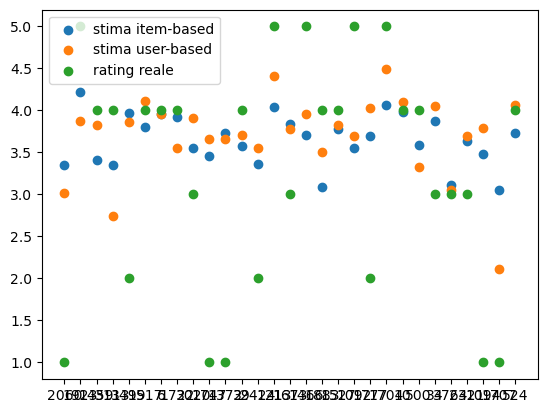

In [48]:
plt.scatter(x,y, label="stima item-based")
plt.scatter(x1,y1, label="stima user-based")
plt.scatter(x1,real, label="rating reale")
plt.legend()

In [46]:
from collections import defaultdict
utente_to_pred=defaultdict(list)
for uid, iid, true_r, est, _ in predictions:
        utente_to_pred[uid].append((iid, est,true_r))

Prediction(uid='5029', iid='2060', r_ui=1.0, est=3.3518803120899285, details={'actual_k': 41, 'was_impossible': False})

In [36]:
x=[]
y=[]
for i,e in utente_to_pred["5029"]:
    x.append(i)
    y.append(e)

In [39]:
trainset = data.build_full_trainset()
algo = KNNBasic(k=30,sim_options= {'name': 'msd', 'user_based': True}, verbose= False)
algo.fit(trainset)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
testset = data.construct_testset(B_raw_ratings)
predictions = algo.test(testset)

In [47]:
x1=[]
y1=[]
real=[]
for i,e,t in utente_to_pred["5029"]:
    x1.append(i)
    y1.append(e)
    real.append(t)

[('5029', '2060', 1.0),
 ('1680', '3420', 5.0),
 ('2261', '647', 3.0),
 ('1040', '736', 2.0),
 ('996', '1060', 4.0),
 ('5689', '2502', 5.0),
 ('1224', '2405', 4.0),
 ('302', '3398', 3.0),
 ('5418', '1641', 4.0),
 ('3131', '1185', 3.0),
 ('150', '182', 3.0),
 ('1068', '2987', 4.0),
 ('5333', '216', 3.0),
 ('3675', '1704', 4.0),
 ('274', '2959', 5.0),
 ('1632', '1032', 2.0),
 ('820', '1356', 3.0),
 ('2760', '2943', 3.0),
 ('4048', '1277', 4.0),
 ('5424', '3404', 3.0),
 ('2015', '1347', 4.0),
 ('3985', '537', 3.0),
 ('4388', '2959', 2.0),
 ('1920', '3251', 5.0),
 ('3885', '1243', 5.0),
 ('4579', '3928', 4.0),
 ('424', '1284', 5.0),
 ('2659', '2203', 4.0),
 ('4543', '2334', 3.0),
 ('5840', '2407', 4.0),
 ('2012', '3591', 3.0),
 ('5647', '2605', 4.0),
 ('1317', '2919', 4.0),
 ('2507', '3174', 3.0),
 ('3546', '2130', 3.0),
 ('4748', '2694', 4.0),
 ('3725', '296', 5.0),
 ('3391', '1213', 5.0),
 ('3129', '3768', 1.0),
 ('2172', '29', 3.0),
 ('1422', '1035', 3.0),
 ('3559', '2976', 5.0),
 ('160

In [5]:
#Primo tentativo di Ibrido


#item-based
trainset = data.build_full_trainset()
algo1 = KNNBasic(k=41,sim_options= {'name': 'msd', 'user_based': False}, verbose= False)
algo1.fit(trainset)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
testset = data.construct_testset(B_raw_ratings)
biasdtestset=trainset.build_testset()
predictions1 = algo1.test(biasdtestset)
#predictions1 = algo1.test(testset)

#user-based
algo2 = KNNBasic(k=30,sim_options= {'name': 'msd', 'user_based': True}, verbose= False)
algo2.fit(trainset)
predictions2 = algo2.test(biasdtestset)
#predictions2 = algo2.test(testset)






In [6]:
X=[]
y=[]
for i in range(len(predictions1)):
    X.append([predictions1[i][3],predictions2[i][3]])
    y.append(predictions1[i][2])

In [7]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(X, y)
reg.score(X, y)

0.7484322212505221

In [8]:
predictions1 = algo1.test(testset)
predictions2 = algo2.test(testset)
X=[]
y=[]
for i in range(len(predictions1)):
    X.append([predictions1[i][3],predictions2[i][3]])
    y.append(predictions1[i][2])

reg.score(X, y)
predictionsIbride=reg.predict(X)

In [19]:
predFinali=[]
for i in range(len(predictions1)):
    predFinali.append(Prediction(predictions1[i].uid, predictions1[i].iid, predictions1[i].r_ui, predictionsIbride[i], predictions1[i].details))

In [25]:
precisions, recalls = precision_recall_at_k(predFinali, k=10, threshold=4)
print(sum(prec for prec in precisions.values()) / len(precisions))
print(sum(rec for rec in recalls.values()) / len(recalls))

0.766107258565019
0.3791716393886449


In [29]:
np.arange(start=0.01,stop=0.1,step=0.01)

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09])

In [5]:
import time

#tempi di training e predict modelli dividsione dati 80-20

#svd train
algo_svd = SVD(n_epochs=30,reg_all=0.05, verbose= False)
start_time = time.time()
algo_svd.fit(trainset)
print("--- %s seconds ---" % (time.time() - start_time))
#svd predict
start_time = time.time()
algo_svd.test(testset)
print("--- %s seconds ---" % (time.time() - start_time))

--- 10.724332809448242 seconds ---
--- 1.7095072269439697 seconds ---


In [6]:
#tempi di training e predict modelli dividsione dati 80-20
#KnnBasic user-based train
algo_knnBase_u = KNNBasic(k=49,sim_options= {'name': 'msd', 'user_based': True}, verbose= False)
start_time = time.time()
algo_knnBase_u.fit(trainset)
print("--- %s seconds ---" % (time.time() - start_time))
#KnnBa#KnnBasic user-based predict
start_time = time.time()
algo_knnBase_u.test(testset)
print("--- %s seconds ---" % (time.time() - start_time))

--- 30.95148015022278 seconds ---
--- 80.3120505809784 seconds ---


In [7]:
#tempi di training e predict modelli dividsione dati 80-20
#KnnBasic item-based train
algo_knnBase_i = KNNBasic(k=49,sim_options= {'name': 'msd', 'user_based': False}, verbose= False)
start_time = time.time()
algo_knnBase_i.fit(trainset)
print("--- %s seconds ---" % (time.time() - start_time))
#KnnBasic item-based predict
start_time = time.time()
algo_knnBase_i.test(testset)
print("--- %s seconds ---" % (time.time() - start_time))

--- 10.40069317817688 seconds ---
--- 36.593724489212036 seconds ---


In [8]:
#tempi di training e predict modelli dividsione dati 80-20
#KnnMeans user-based train
algo_knnMeans_u = KNNBasic(k=49,sim_options= {'name': 'msd', 'user_based': True}, verbose= False)
start_time = time.time()
algo_knnMeans_u.fit(trainset)
print("--- %s seconds ---" % (time.time() - start_time))
#KnnMeans user-based predict
start_time = time.time()
algo_knnMeans_u.test(testset)
print("--- %s seconds ---" % (time.time() - start_time))

--- 30.759082078933716 seconds ---
--- 79.42907547950745 seconds ---


In [9]:
#tempi di training e predict modelli dividsione dati 80-20
#KnnMeans item-based train
algo_knnMeans_i = KNNBasic(k=49,sim_options= {'name': 'msd', 'user_based': False}, verbose= False)
start_time = time.time()
algo_knnMeans_i.fit(trainset)
print("--- %s seconds ---" % (time.time() - start_time))
#KnnMeans user-based predict
start_time = time.time()
algo_knnMeans_i.test(testset)
print("--- %s seconds ---" % (time.time() - start_time))

--- 10.558875560760498 seconds ---
--- 37.84129357337952 seconds ---


In [11]:
from sklearn.linear_model import LinearRegression
#tempi di training e predict modelli dividsione dati 80-20
#knnBase ibrido train
#costruisco un test-set sull training set
biasdtestset=trainset.build_testset()
#predicco i rating sul set con i modelli item-based e user-based 
start_time = time.time()
predictions1 = algo_knnBase_u.test(biasdtestset)
predictions2 = algo_knnBase_i.test(biasdtestset)

#prendo solo i rating predetti e quelli reali per costruire il training set dell'algoritmo ibrido
X=[]
y=[]
for i in range(len(predictions1)):
    X.append([predictions1[i][3],predictions2[i][3]])
    y.append(predictions1[i][2])
#uso regressione lineare per predirre i rating reali sulla base delle predizioni user-based e item-based
algo_KnnBase_ibrido = LinearRegression().fit(X, y)
print("--- %s seconds ---" % (time.time() - start_time))

start_time = time.time()
predictions1 = algo_knnBase_u.test(testset)
predictions2 = algo_knnBase_i.test(testset)
X=[]
y=[]
for i in range(len(predictions1)):
    X.append([predictions1[i][3],predictions2[i][3]])
    y.append(predictions1[i][2])
    
predictionsIbride=algo_KnnBase_ibrido.predict(X)
predFinali=[]
for i in range(len(predictions1)):
    predFinali.append(Prediction(predictions1[i].uid, predictions1[i].iid, predictions1[i].r_ui, predictionsIbride[i], predictions1[i].details))
print("--- %s seconds ---" % (time.time() - start_time))



--- 417.14910316467285 seconds ---
--- 112.80837202072144 seconds ---


In [12]:
#tempi di training e predict modelli dividsione dati 80-20
#knnMeansibrido train
#costruisco un test-set sull training set
biasdtestset=trainset.build_testset()
#predicco i rating sul set con i modelli item-based e user-based 
start_time = time.time()
predictions1 = algo_knnMeans_u.test(biasdtestset)
predictions2 = algo_knnMeans_i.test(biasdtestset)

#prendo solo i rating predetti e quelli reali per costruire il training set dell'algoritmo ibrido
X=[]
y=[]
for i in range(len(predictions1)):
    X.append([predictions1[i][3],predictions2[i][3]])
    y.append(predictions1[i][2])
#uso regressione lineare per predirre i rating reali sulla base delle predizioni user-based e item-based
algo_KnnMeans_ibrido = LinearRegression().fit(X, y)
print("--- %s seconds ---" % (time.time() - start_time))

start_time = time.time()
predictions1 = algo_knnMeans_u.test(testset)
predictions2 = algo_knnMeans_i.test(testset)
X=[]
y=[]
for i in range(len(predictions1)):
    X.append([predictions1[i][3],predictions2[i][3]])
    y.append(predictions1[i][2])
    
predictionsIbride=algo_KnnMeans_ibrido.predict(X)
predFinali=[]
for i in range(len(predictions1)):
    predFinali.append(Prediction(predictions1[i].uid, predictions1[i].iid, predictions1[i].r_ui, predictionsIbride[i], predictions1[i].details))
print("--- %s seconds ---" % (time.time() - start_time))

--- 418.52566623687744 seconds ---
--- 113.34348344802856 seconds ---


In [14]:
from surprise import SlopeOne
#tempi di training e predict modelli dividsione dati 80-20
#KnnMeans item-based train
algo_slope = SlopeOne()
start_time = time.time()
algo_slope.fit(trainset)
print("--- %s seconds ---" % (time.time() - start_time))
#KnnMeans user-based predict
start_time = time.time()
algo_slope.test(testset)
print("--- %s seconds ---" % (time.time() - start_time))

--- 9.275396585464478 seconds ---
--- 29.521485805511475 seconds ---
